# Evaluate model performance
__Note:__ For this tutorial to work, you first need to download some data and example models (266MB) from [here](https://www.dropbox.com/sh/wnj3389k8ei8i1c/AACy7apWxW87IS_fBjI8-7WDa?dl=0) and put the four folders in the `tutorials` folder.


## TODO:
- use dss.evaluate functions
- check labels and confmat normalization
- specgram y tick labels
- add numbers to confmat cells
- find a way to have is save inline figures as png, not svg - memory footprint is currently huge

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.metrics
import librosa.feature, librosa.display
import dss.utils, dss.utils_plot, dss.predict, dss.event_utils, dss.segment_utils, dss.io, dss.evaluate

plt.style.use('ncb.mplstyle')

`save_name` should be the stem common to all files produced during training.
For instance, if the parameter file for the model is `res/20191121_094529_params.yaml`, then `save_name` should be `res/20191121_094529`.

The tutorials come with two networks to for Dmel pulse song:
- `models/dmel_pulse_tcn_single_channel/` is an optimal model for dmel single-channel pulse song
- `res/20191128_170521` is a smaller TCN model  trained for 20 epochs on the toy data set produced by [1_prepare_data.ipynb](1_prepare_data.ipynb) and trained with the parameters in [2_training.ipynb](2_training.ipynb).

In [2]:
save_name = '/Users/janc/Dropbox/dss.paper/models/dmel_all/20200507_173738'  # single-channel dmel pulse and sine model

params = dss.utils.load_params(save_name)

print(params)

fs = params['samplerate_y_Hz']

try: 
    segment_pred_index = params['class_types'][1:].index('segment') + 1
    print(f'model predicts segments at index {segment_pred_index}')
except ValueError:
    print('model does not predict segments.')
    segment_pred_index = None

   
try: 
    pulse_pred_index = params['class_types'].index('event')    
    print(f'model predicts pulses at index {pulse_pred_index}')
except ValueError:
    print('model does not predict pulse.')
    pulse_pred_index = None

{'batch_level_subsampling': False, 'batch_norm': True, 'batch_size': 32, 'class_names': ['noise', 'sine', 'pulse'], 'class_names_pulse': ['noise', 'pulse'], 'class_names_sine': ['noise', 'sine'], 'class_types': ['segment', 'segment', 'event'], 'class_types_pulse': ['segment', 'event'], 'class_types_pulse_fss': ['segment', 'event'], 'class_types_sine': ['segment', 'segment'], 'class_types_sine_fss': ['segment', 'segment'], 'data_dir': '../dat/dmel_single_stern_raw.npy', 'data_padding': 96, 'eventtimes_units': 'seconds', 'filename_endsample_test': [], 'filename_endsample_train': [], 'filename_endsample_val': [], 'filename_startsample_test': [], 'filename_startsample_train': [], 'filename_startsample_val': [], 'filename_test': [], 'filename_train': [], 'filename_val': [], 'first_sample_train': 0, 'first_sample_val': 0, 'fraction_data': None, 'ignore_boundaries': True, 'kernel_size': 32, 'last_sample_train': None, 'last_sample_val': None, 'model_name': 'tcn', 'nb_channels': 1, 'nb_classes'

# Get predictions
Either load from `_results.h5` or by running the model with test data.

Note that `dss.predict.predict` detects events and segments for us - this is typically where we would stop if we just wanted to get predictions. For evaluation, we're going to work with the raw confidence values `y_pred` - postprocess them to detect events and segments.

In [3]:
load_results = False
if load_results and os.path.exists(save_name + '_results.h5'):
    print(f'loading results file produced at the end of training.')
    datasets = dss.utils.load_from(save_name + '_results.h5', ['x_test', 'y_test', 'y_pred'])
    x_test, y_test, y_pred = [datasets[key] for key in ['x_test', 'y_test', 'y_pred']]  # unpack dict items to vars
else:
    # params['data_dir']
    data = dss.io.load('/Users/janc/Dropbox/dss.paper/dat/dmel_single_stern_raw.npy')
    x_test = data['test']['x']
    y_test = data['test']['y'].astype(np.float)
    events_ignore, segments_ignore, y_pred = dss.predict.predict(x_test, model_save_name=save_name, verbose=1, batch_size=1)

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.


In [4]:
events, segments = dss.predict.predict_song(y_pred, params, segment_minlen=0.02, segment_fillgap=0.02)

## Inspect the raw confidence scores
Will be post-processed to detect event times and smooth segments.

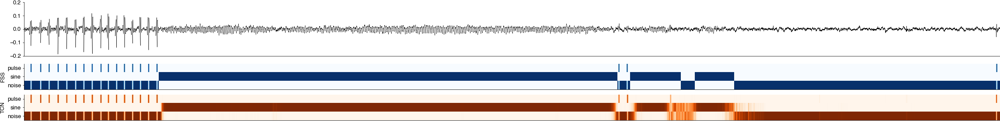

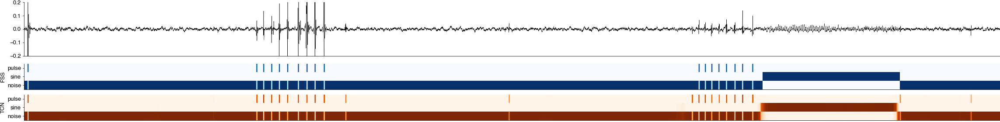

In [5]:
for t0 in [150_000, 260_000]:
    t1 = int(t0 + 40_000)
    
    plt.figure()
    plt.gcf().set_size_inches(40,5)
    plt.subplot(211)
    plt.plot(x_test[t0:t1], c='k', linewidth=0.5)
    plt.xlim(0, (t1-t0))
    plt.ylim(-0.2, 0.2)
    plt.xticks([])
    dss.utils_plot.remove_axes()

    plt.subplot(413)
    plt.imshow(y_test[t0:t1].T, cmap='Blues')

    plt.yticks(range(len(params['class_names'])), labels=params['class_names'])
    plt.ylabel('FSS')
    plt.xticks([])
    dss.utils_plot.remove_axes()

    plt.subplot(414)
    plt.imshow(y_pred[t0:t1].T, cmap='Oranges')
    plt.yticks(range(len(params['class_names'])), labels=params['class_names'])
    plt.ylabel('TCN')
    plt.xticks([])
    dss.utils_plot.remove_axes()
    

## Evaluate events
Evaluate event timing

FP 50, TP 635, FN 6
precision 0.93, recall 0.99, f1-score 0.96


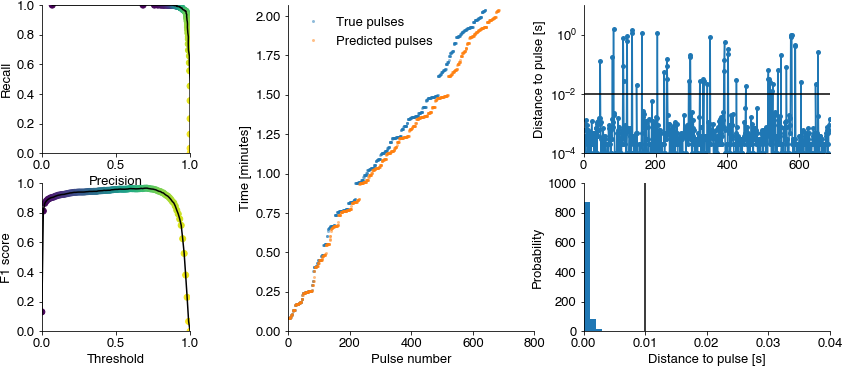

In [7]:
def prc_pulse(pred_pulse, pulsetimes_true, fs, tol, min_dist, dwn_smp=1, y_offset=0, thresholds=None):
    if thresholds is None:
        thresholds = np.arange(0, 1.01, 0.01)
    precision = []
    recall = []
    f1_score = []
    threshold = []

    for thres in thresholds:
        pulsetimes_pred, pulsetimes_pred_confidence = dss.event_utils.detect_events(pred_pulse, thres=thres, min_dist=min_dist)
        pulsetimes_pred = pulsetimes_pred / fs
        d, nn_pred_pulse, nn_true_pulse, nn_dist = dss.event_utils.evaluate_eventtimes(pulsetimes_true, pulsetimes_pred, fs, tol)
        precision.append(d['precision'])
        recall.append(d['recall'])
        f1_score.append(d['f1_score'])
        threshold.append(thres)
    return threshold, precision, recall, f1_score

# Evaluate events based on timing, allowing for some tolerance
tol = .01  # seconds = 10ms
min_dist = 0.01
    
if pulse_pred_index is not None:
    pulsetimes_true, _ = dss.event_utils.detect_events(y_test[:, pulse_pred_index], thres=0.5, min_dist=100)
    pulsetimes_true =  pulsetimes_true / fs
    
    # calc f1 score for different thresholds and choose opt threshold
    threshold, precision, recall, f1_score = prc_pulse(y_pred[:, pulse_pred_index], pulsetimes_true, fs, tol, min_dist * fs)
    threshold_opt = threshold[np.argmax(f1_score)]

    pulsetimes_pred = events['pulse']['seconds']
    d, nn_pred_pulse, nn_true_pulse, nn_dist = dss.event_utils.evaluate_eventtimes(pulsetimes_true, pulsetimes_pred, fs, tol)
    
    print(f"FP {d['FP']}, TP {d['TP']}, FN {d['FN']}")
    print(f"precision {d['precision']:1.2f}, recall {d['recall']:1.2f}, f1-score {d['f1_score']:1.2f}")
    
    plt.gcf().set_size_inches(15, 6)
    plt.subplot(231)
    plt.plot(precision, recall, c='k')
    plt.scatter(precision, recall, c=threshold)
    plt.xlabel('Precision')
    plt.ylabel('Recall')
    plt.axis('square')
    plt.xlim(0, 1)
    plt.ylim(0, 1)
    
    plt.subplot(234)
    plt.plot(threshold, f1_score, c='k')
    plt.scatter(threshold, f1_score, c=threshold)
    plt.xlabel('Threshold')
    plt.ylabel('F1 score')
    plt.axis('square')
    plt.xlim(0, 1)
    plt.ylim(0, 1)
    
    plt.subplot(132)
    plt.plot(pulsetimes_true / 60, '.', alpha=0.5)
    plt.plot(pulsetimes_pred / 60, '.', alpha=0.5)
    plt.legend(['True pulses', 'Predicted pulses'])
    plt.xlabel('Pulse number')
    plt.ylabel('Time [minutes]')
    plt.ylim(0, x_test.shape[0] / fs / 60 * 1.01)
    dss.utils_plot.remove_axes()

    plt.subplot(233)
    plt.plot(nn_dist, '.-', markersize=10)
    plt.xlim(0, len(nn_dist))
    plt.axhline(tol, color='k')
    plt.yscale('log')
    plt.ylabel('Distance to pulse [s]')
    dss.utils_plot.remove_axes()

    plt.subplot(236)
    plt.hist(nn_dist, bins=np.arange(0, 4 * tol, .001), density=True)
    plt.axvline(tol, color='k')
    plt.xlabel('Distance to pulse [s]')
    plt.ylabel('Probability');
    dss.utils_plot.remove_axes()

Plot the shapes of false/true positive/negative pulses - if you use the network trained on the toy data set, most false positives arise from wrong annotations

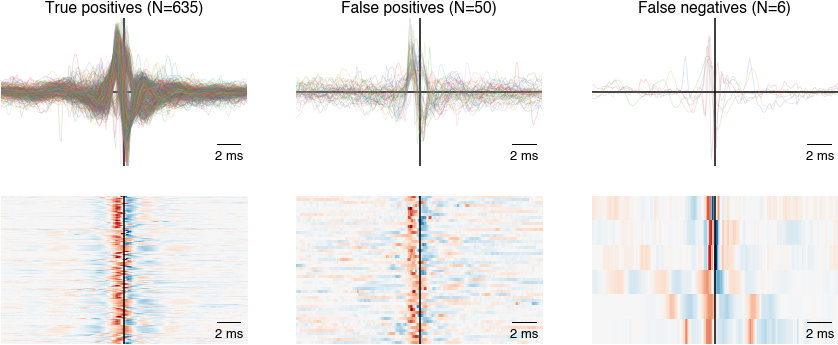

In [8]:
import dss.pulse_utils
def plot_pulses(pulseshapes, col=1, title=''):
    win_hw = pulseshapes.shape[0]/2
    plt.subplot(2, 3, col)
    plt.axvline(win_hw, color='k')
    plt.axhline(0, color='k')
    plt.plot(pulseshapes, linewidth=0.75, alpha=0.2)
    plt.ylim(-0.5, 0.5)
    plt.title(title)
    dss.utils_plot.scalebar(2, units='ms', dx=0.1)
    dss.utils_plot.remove_axes(all=True)
    
    plt.subplot(2, 3, col+3)
    plt.imshow(pulseshapes.T, cmap='RdBu_r')
    plt.clim(-0.5, 0.5)
    plt.axvline(win_hw, color='k')
    dss.utils_plot.scalebar(2, units='ms', dx=0.1)
    dss.utils_plot.remove_axes(all=True)

win_hw = 100
if pulse_pred_index is not None:
    pulseshapes_pred = dss.pulse_utils.get_pulseshapes(pulsetimes_pred * fs + win_hw, x_test, win_hw)
    pulsenorm_pred = np.linalg.norm(np.abs(pulseshapes_pred[50:-50,:]), axis=0)
    pulsefreq_pred = np.array([dss.pulse_utils.pulse_freq(p)[0] for p in pulseshapes_pred[50:-50,:].T])
    pulseshapes_pred = np.apply_along_axis(dss.pulse_utils.normalize_pulse, axis=-1, arr=pulseshapes_pred.T).T
    tp_pulses = pulseshapes_pred[:, ~nn_pred_pulse.mask]
    fp_pulses = pulseshapes_pred[:, nn_pred_pulse.mask]

    pulseshapes_true = dss.pulse_utils.get_pulseshapes(pulsetimes_true * fs + win_hw, x_test, win_hw)
    pulsenorm_true = np.linalg.norm(np.abs(pulseshapes_true[50:-50,:]), axis=0)
    pulsefreq_true = np.array([dss.pulse_utils.pulse_freq(p)[0] for p in pulseshapes_true[50:-50,:].T])
    pulseshapes_true = np.apply_along_axis(dss.pulse_utils.normalize_pulse, axis=-1, arr=pulseshapes_true.T).T

    fn_pulses = pulseshapes_true[:, nn_true_pulse.mask]

    plt.figure(figsize=(15, 6))
    plot_pulses(tp_pulses, 1, f'True positives (N={tp_pulses.shape[1]})')
    plot_pulses(fp_pulses, 2, f'False positives (N={fp_pulses.shape[1]})')
    plot_pulses(fn_pulses, 3, f'False negatives (N={fn_pulses.shape[1]})')

### Troubleshooting
Things to do when the predictions look weird:
- Plot the raw predictions alongside the input song recording, the labels used for training, and the raw event times. This will reveal whether there is an offset or even a mismatch in sampling frequencies.
- Plot at the shape of false negative and false positive pulses and look for patterns. Maybe there are weird shapes in the false negatives or many "good looking" pulses in the false negatives, indicating problems with the groundtruth (manual annotation).
- Inspect the amplitude and frequency of false negative and false positive pulses and look for patterns. Maybe the network fails for soft pulses

## Evaluate segments 

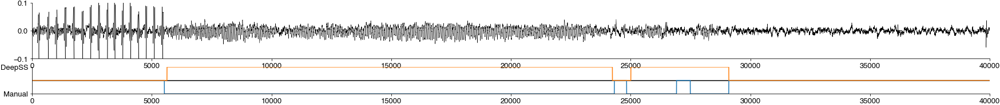

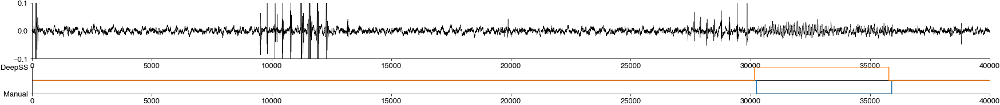

In [10]:
for t0 in [150_000, 260_000]:
    t1 = int(t0 + 40_000)
    
    plt.figure()
    plt.gcf().set_size_inches(30,4)
    plt.subplot(211)
    plt.plot(x_test[t0:t1], c='k', linewidth=0.5)
    plt.xlim(0, (t1-t0))
    plt.ylim(-0.1, 0.1)
    dss.utils_plot.remove_axes()

    plt.subplot(413)
    plt.axhline(0, c='k')
    plt.plot(-y_test[t0:t1, segments['sine']['index']])
    plt.plot(segments['sine']['samples'][t0:t1])
    plt.yticks([-1, 1], labels=['Manual', 'DeepSS'])
    dss.utils_plot.remove_axes()
    

## Sample-wise evaluation of segments

Best f1 score of 0.96 at a threshold or 0.66.
              precision    recall  f1-score   support

       noise      0.996     0.987     0.991   1060420
        sine      0.920     0.977     0.947    165628

    accuracy                          0.985   1226048
   macro avg      0.958     0.982     0.969   1226048
weighted avg      0.986     0.985     0.985   1226048



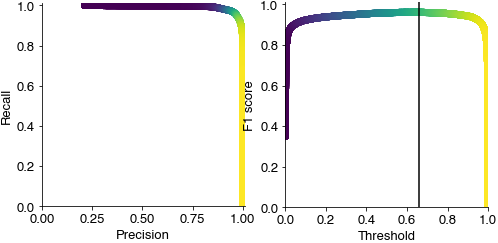

<Figure size 432x288 with 0 Axes>

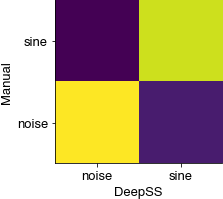

In [22]:
# Calculate PR-curve - this one does not post-process labels (fill gaps, remove short segments)
min_len = min(y_pred.shape[0], y_test.shape[0])
precision, recall, threshold = sklearn.metrics.precision_recall_curve(y_test[:min_len:10, segment_pred_index]>0.5,
                                                                      y_pred[:min_len:10, segment_pred_index])    
f1score = 2 * (precision * recall) / (precision + recall)
threshold_opt = threshold[np.argmax(f1score)]

plt.figure(figsize=(8, 4))
plt.subplot(1,2,1)
plt.scatter(precision[:-1:10], recall[:-1:10], c=threshold[::10])
plt.xlabel('Precision')
plt.ylabel('Recall')
plt.axis('square')
plt.xlim(0, 1.01)
plt.ylim(0, 1.01)

plt.subplot(1,2,2)
plt.scatter(threshold[:], f1score[:-1], c=threshold[:])
plt.axvline(threshold_opt, c='k')
plt.xlabel('Threshold')
plt.ylabel('F1 score')
plt.axis('square')
plt.xlim(0, 1)
plt.ylim(0, 1.01)
plt.figure()

print(f'Best f1 score of {np.max(f1score):1.2f} at a threshold or {threshold_opt:1.2f}.')

conf_mat, report = dss.evaluate.evaluate_segments(y_test[:min_len, segment_pred_index]>0.5, 
                                                  segments['sine']['samples'][:min_len],
                                                  np.array(params['class_names'])[[0, segment_pred_index]])
print(report)
# TODO check normalization

conf_mat_norm = conf_mat/np.sum(conf_mat, axis=0)

plt.figure(figsize=(3, 3))
plt.imshow(conf_mat_norm)
plt.xticks((0, 1), labels=['noise', 'sine'])
plt.yticks((0, 1), labels=['noise', 'sine'])
plt.xlabel('DeepSS')
plt.ylabel('Manual')
plt.show()


## Evaluate segment timing

10000
{'FP': 10, 'TP': 34, 'FN': 5, 'precision': 0.7727272727272727, 'recall': 0.8717948717948718, 'f1_score': 0.8192771084337349}
{'FP': 10, 'TP': 34, 'FN': 5, 'precision': 0.7727272727272727, 'recall': 0.8717948717948718, 'f1_score': 0.8192771084337349}
Temporal errors of all predicted sine onsets: 10.20 ms
Temporal errors of all predicted sine offsets: 12.10 ms


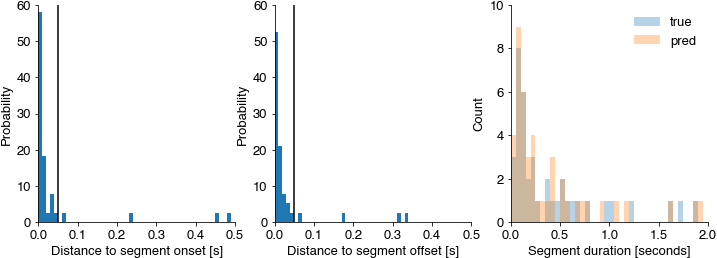

In [14]:
def fixlen(onsets, offsets):
    if len(onsets) > len(offsets):
        onsets = onsets[:-1]
    elif len(offsets) > len(onsets):
        offsets = offsets[1:]
    return onsets, offsets
    
tol = .05  # seconds = 50ms
print(fs)
if segment_pred_index is not None:
    segment_labels_true = (y_test[:, segment_pred_index]>0.5).astype(np.float)
    segment_labels_pred = segments['sine']['samples']
    segment_onset_times_true, segment_offset_times_true = fixlen(*dss.evaluate.segment_timing(segment_labels_true, fs))
    segment_onset_times_pred, segment_offset_times_pred = fixlen(*dss.evaluate.segment_timing(segment_labels_pred, fs))
    
    durations_true = segment_offset_times_true - segment_onset_times_true
    durations_pred = segment_offset_times_pred - segment_onset_times_pred

    segment_onsets_report, segment_offsets_report, nearest_predicted_onsets, nearest_predicted_offsets = dss.evaluate.evaluate_segment_timing(segment_labels_true, segment_labels_pred, fs, tol)

    print(segment_onsets_report)
    print(segment_offsets_report)
    print(f'Temporal errors of all predicted sine onsets: {np.median(nearest_predicted_onsets)*1000:1.2f} ms')
    print(f'Temporal errors of all predicted sine offsets: {np.median(nearest_predicted_offsets)*1000:1.2f} ms')
    
    plt.figure(figsize=(12, 4))
    plt.subplot(131)
    plt.hist(nearest_predicted_onsets, bins=np.arange(0, 10 * tol, .01), density=True)
    plt.axvline(tol, color='k')
    plt.xlabel('Distance to segment onset [s]')
    plt.ylabel('Probability');
    dss.utils_plot.remove_axes()

    plt.subplot(132)
    plt.hist(nearest_predicted_offsets, bins=np.arange(0, 10 * tol, .01), density=True)
    plt.axvline(tol, color='k')
    plt.xlabel('Distance to segment offset [s]')
    plt.ylabel('Probability');
    dss.utils_plot.remove_axes()

    plt.subplot(133)
    plt.hist(durations_true, bins=np.arange(0, 2, 0.05), histtype='bar', label='true', alpha=0.33)
    plt.hist(durations_pred, bins=np.arange(0, 2, 0.05), histtype='bar', label='pred', alpha=0.33)
    plt.xlabel('Segment duration [seconds]')
    plt.ylabel('Count')
    plt.legend()
    dss.utils_plot.remove_axes()
    

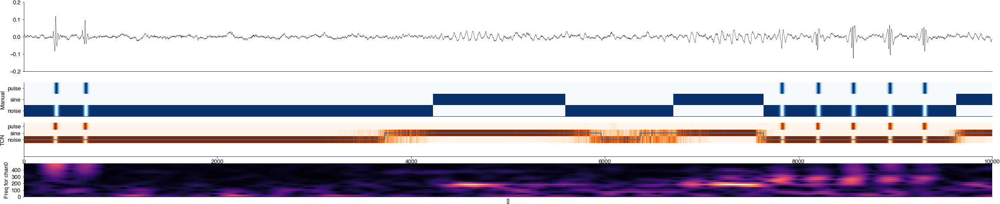

In [21]:
t0 = 55_000
t1 = t0 + 10_000

nb_channels = x_test.shape[1]
x_snippet = x_test[t0:t1,:]

plt.figure(figsize=(40, 10))

plt.subplot((nb_channels+5)/2, 1, 1)
plt.plot(x_snippet + np.arange(nb_channels)/10, c='k', linewidth=0.5)
plt.xticks([])
plt.ylim(-0.2, 0.2)

plt.subplot(nb_channels+5,1, 3)
plt.imshow(y_test[t0:t1].T, cmap='Blues')
plt.yticks(range(len(params['class_names'])), labels=params['class_names'])
plt.ylabel('Manual')
plt.xticks([])
dss.utils_plot.remove_axes()

plt.subplot(nb_channels+5,1, 4)
plt.imshow(y_pred[t0:t1].T, cmap='Oranges')
plt.plot(segment_labels_pred[t0:t1], linewidth=2)
plt.yticks(range(len(params['class_names'])), labels=params['class_names'])
plt.ylabel('TCN')
plt.xlim(0, t1 - t0)
dss.utils_plot.remove_axes()

for cnt, x in enumerate(x_snippet.T):
    specgram = librosa.feature.melspectrogram(x, sr=10000, n_fft=512, hop_length=1, power=1)
    plt.subplot(nb_channels+5,1, 5+cnt)
    librosa.display.specshow(np.log2(1 + specgram), sr=10_000, hop_length=1, y_axis='mel', x_axis='ms')
    plt.clim(0, 0.2)
    plt.ylim(0, 500)
    dss.utils_plot.remove_axes()
    if cnt<8:
        plt.xticks([])
        plt.xlabel([])
    plt.yticks(np.arange(0, 500, 100))    
    plt.ylabel(f'Freq for chan{cnt}')